In [1]:
## Ref: https://www.kaggle.com/andradaolteanu/birdcall-recognition-eda-and-audio-fe

In [2]:
# Our Libraries

import os
import sys
sys.version

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

# Map 1 
import plotly.express as px

# Map 2 
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

# Librosa 
import librosa
import librosa.display
import IPython.display as ipd

import sklearn

import warnings
warnings.filterwarnings('ignore')

print("done")

done


In [3]:
# Import data
train_csv = pd.read_csv("../venv/train.csv")
test_csv = pd.read_csv("../venv/test.csv")

# Create some time features
train_csv['year'] = train_csv['date'].apply(lambda x: x.split('-')[0])
train_csv['month'] = train_csv['date'].apply(lambda x: x.split('-')[1])
train_csv['day_of_month'] = train_csv['date'].apply(lambda x: x.split('-')[2])

print("There are {:,} unique bird species in the full dataset.".format(len(train_csv['species'].unique())))
contents = ['Alder Flycatcher', 'American Crow', 'Barred Owl', 'Belted Kingfisher', 'Great Horned Owl', 'Mourning Dove', 'Semipalmated Plover']
train_csv = train_csv[train_csv.species.isin(contents)]
train_csv.species.unique()
print("There are {:,} unique bird species in the limited dataset: ".format(len(train_csv['species'].unique())))
print(contents)
train_csv.ebird_code.unique()

There are 264 unique bird species in the full dataset.
There are 7 unique bird species in the limited dataset: 
['Alder Flycatcher', 'American Crow', 'Barred Owl', 'Belted Kingfisher', 'Great Horned Owl', 'Mourning Dove', 'Semipalmated Plover']


array(['aldfly', 'amecro', 'belkin1', 'brdowl', 'grhowl', 'moudov',
       'semplo'], dtype=object)

### TEST.csv - let's take a look here as well before going further

> 📌**Note**:
* only 3 rows available (rest are in the hidden set)
* `site`: there are 3 sites in total, with first 2 having labeles every 5 seconds, while site_3 has labels at file level.
* `row_id`: this is the unique ID that will be used for the submission
* `seconds`: how long the clip is
* `audio_id`: `row_id` without site

*PS: "nocall" can be also one of the labels (hearing no bird).*

In [4]:
# Inspect text_csv before checking train data
test_csv

,site,row_id,seconds,audio_id
0,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_5,5,0a997dff022e3ad9744d4e7bbf923288
1,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_10,10,0a997dff022e3ad9744d4e7bbf923288
2,site_1,site_1_0a997dff022e3ad9744d4e7bbf923288_15,15,0a997dff022e3ad9744d4e7bbf923288


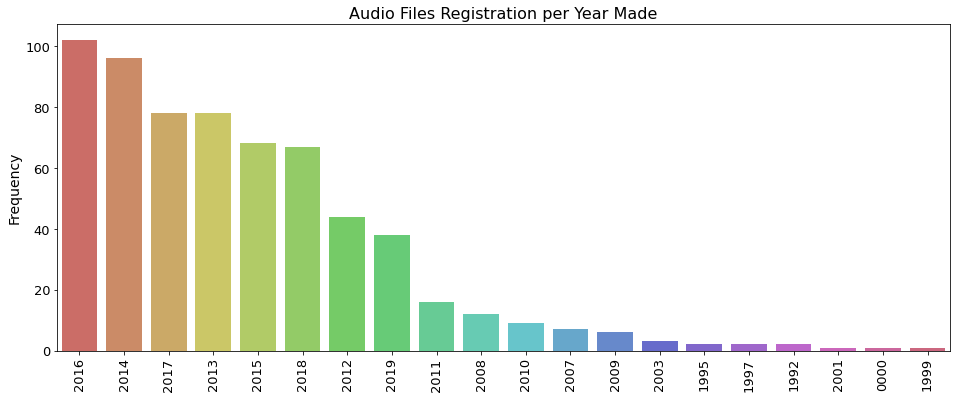

In [5]:
## TIME of recording
## 00 is for the dates 0000-00-00, which are unknown

xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(train_csv['year'], palette="hls", order = train_csv['year'].value_counts().index)

plt.title("Audio Files Registration per Year Made", fontsize=16)
plt.xticks(rotation=90, fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("");

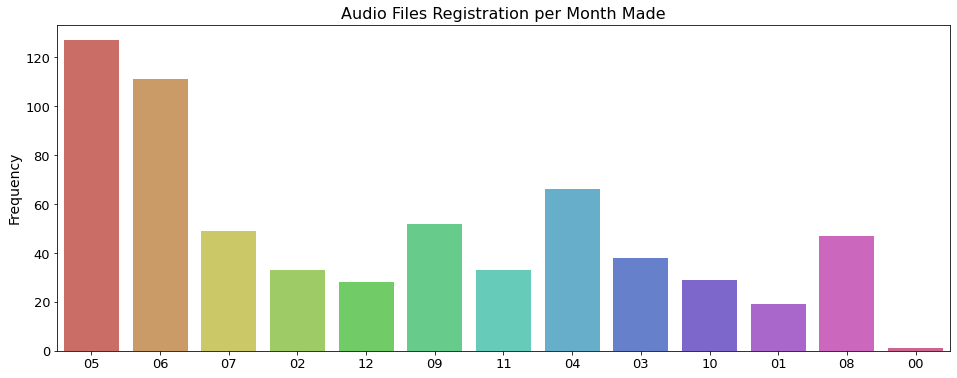

In [6]:
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(train_csv['month'], palette="hls") #, order = train_csv['month'].value_counts().index)

plt.title("Audio Files Registration per Month Made", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("");

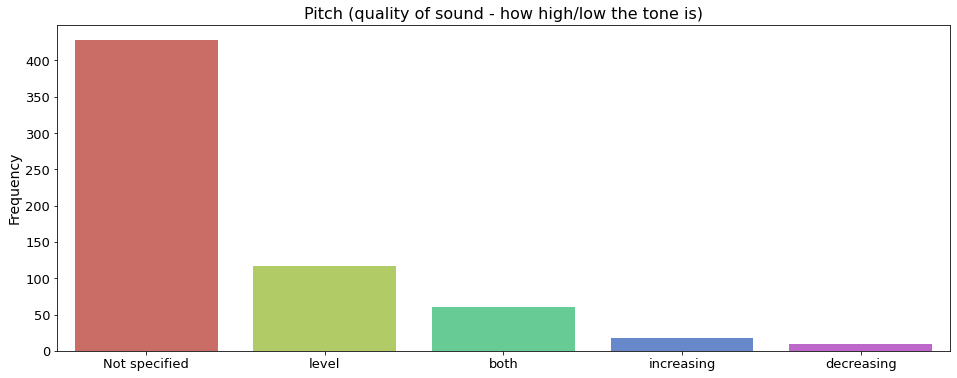

In [7]:
## NOTE: Pitch is usually unspecified. 
## This is one of the more miscellaneous columns, that we need to be careful how we interpret. Most Song Types are call, song or flight
##

xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(train_csv['pitch'], palette="hls", order = train_csv['pitch'].value_counts().index)

plt.title("Pitch (quality of sound - how high/low the tone is)", fontsize=16)
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel("Frequency", fontsize=14)
plt.xlabel("");

**Type Column**:

> 📌**Note**: This column is a bit messy, as the same description can be found under multiple names. Also, there can be multiple descriptions for multiple sounds (one bird song can mean a different thing from another one in the same recording). Some examples are:
* **alarm call** is: alarm call | alarm call, call 
* **flight call** is: flight call | call, flight call etc.

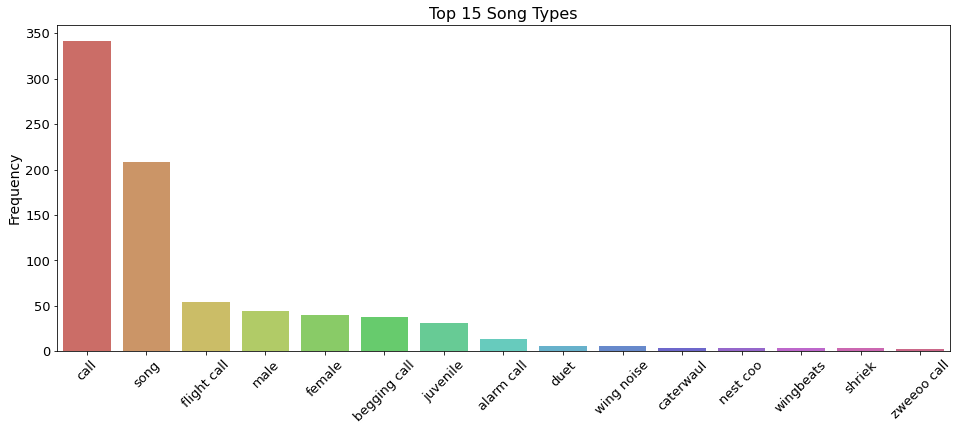

In [8]:
# Create a new variable type by exploding all the values
adjusted_type = train_csv['type'].apply(lambda x: x.split(',')).reset_index().explode("type")

# Strip of white spaces and convert to lower chars
adjusted_type = adjusted_type['type'].apply(lambda x: x.strip().lower()).reset_index()
adjusted_type['type'] = adjusted_type['type'].replace('calls', 'call')

# Create Top 15 list with song types
top_15 = list(adjusted_type['type'].value_counts().head(15).reset_index()['index'])
data = adjusted_type[adjusted_type['type'].isin(top_15)]

# Plot
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(data['type'], palette="hls", order = data['type'].value_counts().index)

plt.title("Top 15 Song Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");

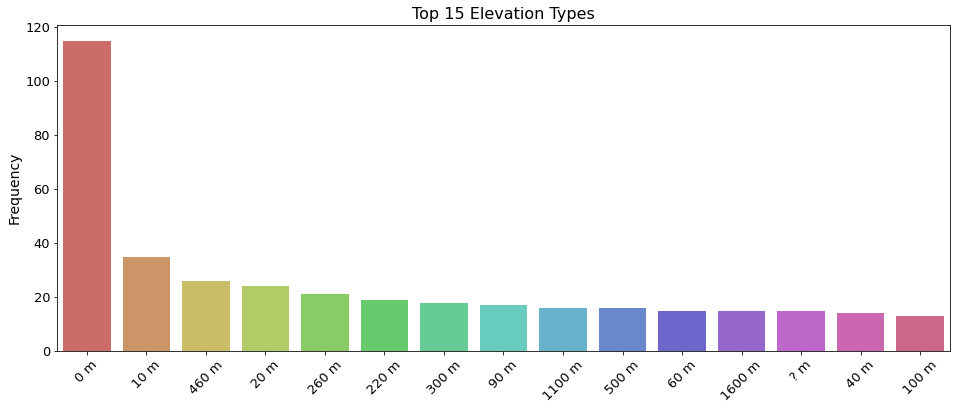

In [9]:
## == WHERE IS THE BIRD? ==
## Note: In most recordings the birds were seen, usually at an altitude between 0m and 10m.

# Top 15 most common elevations
top_15 = list(train_csv['elevation'].value_counts().head(15).reset_index()['index'])
data = train_csv[train_csv['elevation'].isin(top_15)]

# PLOT 
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(data['elevation'], palette="hls", order = data['elevation'].value_counts().index)

plt.title("Top 15 Elevation Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");

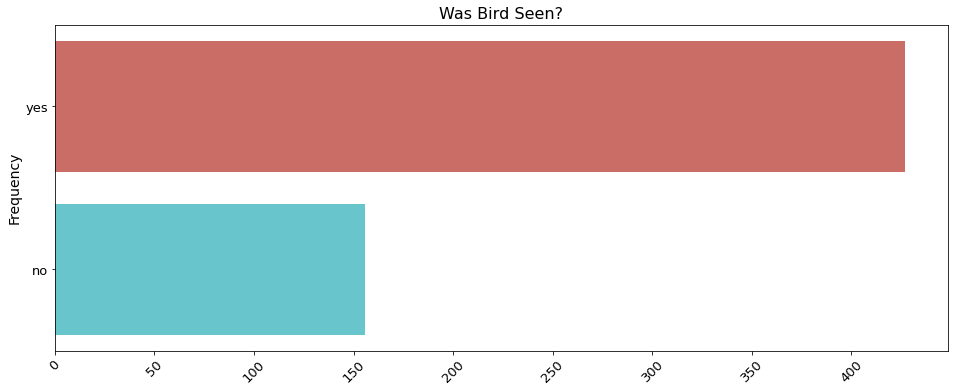

In [10]:
# Create data
data = train_csv['bird_seen'].value_counts().reset_index()

#PLOT
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.barplot(x = 'bird_seen', y = 'index', data = data, palette="hls")

plt.title("Was Bird Seen?", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");

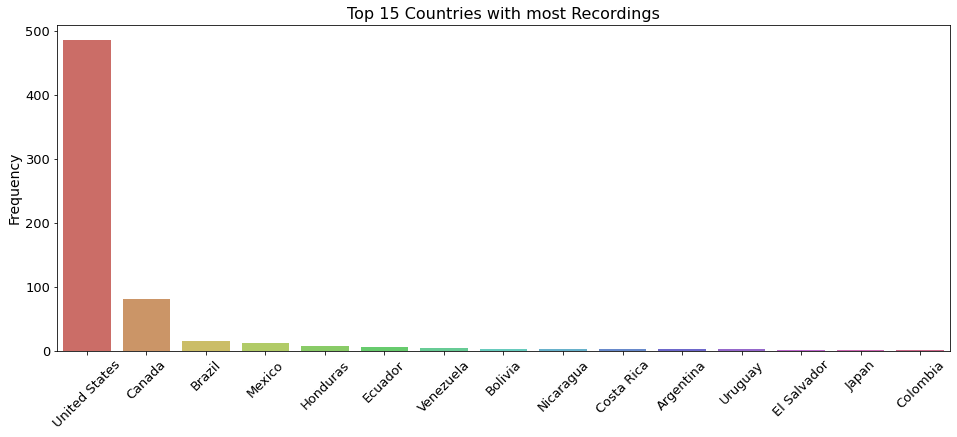

In [11]:
# Top 15 most common Countries
top_15 = list(train_csv['country'].value_counts().head(15).reset_index()['index'])
data = train_csv[train_csv['country'].isin(top_15)]

#PLOT
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(data['country'], palette='hls', order = data['country'].value_counts().index)

plt.title("Top 15 Countries with most Recordings", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");



In [12]:
# Import gapminder data, where we have country and iso ALPHA codes
#df = px.data.gapminder().query("year==2007")[["country", "iso_alpha"]]

# Merge the tables together (we lose a fiew rows, but not many)
#data = pd.merge(left=train_csv, right=df, how="inner", on="country")

# Group by country and count how many species can be found in each
#data = data.groupby(by=["country", "iso_alpha"]).count()["species"].reset_index()

#fig = px.choropleth(data, locations="iso_alpha", color="species", hover_name="country",
#                    color_continuous_scale=px.colors.sequential.Teal,
#                    title = "World Map: Recordings per Country")
#fig.show()

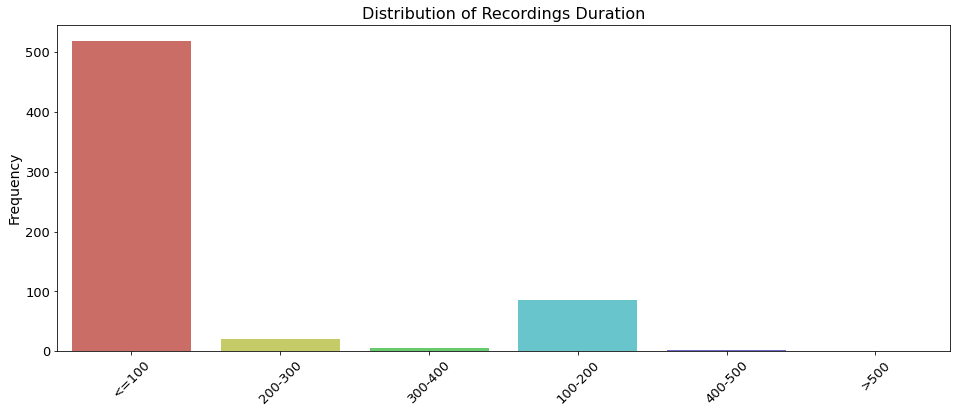

In [13]:
## === Duration of recordings ===

# Creating Interval for *duration* variable
train_csv['duration_interval'] = ">500"
train_csv.loc[train_csv['duration'] <= 100, 'duration_interval'] = "<=100"
train_csv.loc[(train_csv['duration'] > 100) & (train_csv['duration'] <= 200), 'duration_interval'] = "100-200"
train_csv.loc[(train_csv['duration'] > 200) & (train_csv['duration'] <= 300), 'duration_interval'] = "200-300"
train_csv.loc[(train_csv['duration'] > 300) & (train_csv['duration'] <= 400), 'duration_interval'] = "300-400"
train_csv.loc[(train_csv['duration'] > 400) & (train_csv['duration'] <= 500), 'duration_interval'] = "400-500"

xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(train_csv['duration_interval'], palette="hls")

plt.title("Distribution of Recordings Duration", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");

In [14]:
def show_values_on_bars(axs, h_v="v", space=0.4):
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()
                value = int(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

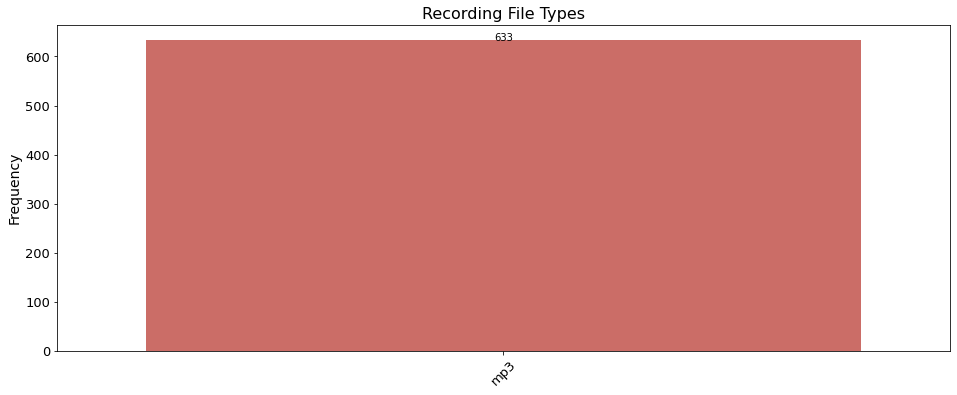

In [15]:
xy = (0.5, 0.7)
plt.figure(figsize=(16, 6))
ax = sns.countplot(train_csv['file_type'], palette = "hls", order = train_csv['file_type'].value_counts().index)

show_values_on_bars(ax, "v", 0)

plt.title("Recording File Types", fontsize=16)
plt.ylabel("Frequency", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(rotation=45, fontsize=13)
plt.xlabel("");

In [16]:
# Create Full Path so we can access data more easily
base_dir = 'train_audio_full/'
train_csv['full_path'] = base_dir + train_csv['ebird_code'] + '/' + train_csv['filename']

# Now let's sample a fiew audio files
#amecro_sample = ['XC114550', 'XC114554', 'XC114557', 'XC114560', 'XC115939', 'XC126022', 'XC114551', 'XC114555', 'XC114558', 'XC114561', 'XC115940','XC131445', 'XC114552', 'XC114556', 'XC114559', 'XC115938', 'XC121396']
amecro = train_csv[(train_csv['ebird_code'] == "amecro")].sample(1, random_state = 33)['full_path'].values[0]
aldfly = train_csv[train_csv['ebird_code'] == "aldfly"].sample(1, random_state = 33)['full_path'].values[0]

bird_sample_list = ["amecro", "aldfly"]

In [51]:
ipd.Audio(amecro)

In [52]:
## convert mp3 to wav
import subprocess 
import sys
sys.path.append('/path/to/ffmpeg')

from os import path
from pydub import AudioSegment 
# mp3 file path
mpath = os.fspath(amecro)

# get file name
fname = os.path.basename(os.path.normpath(mpath)).strip('.mp3')

# get base path
bpath = mpath.strip(fname+'.mp3')

# set new path to converted wav file
wpath = fname.strip('.mp3')+'.wav'

# assign files 
src = mpath
dst = bpath+wpath
print(src)
print(dst)

# convert mp3 file to wav file 

# convert wav to mp3     
AudioSegment.converter = '/usr/local/Cellar/ffmpeg/4.3.2/bin/ffmpeg'
sound = AudioSegment.from_mp3(src)
sound.export(dst, format="wav")

subprocess.call(['ffmpeg', '-i', mpath, wpath])


train_audio_full/amecro/XC312752.mp3
train_audio_full/amecro/XC312752.wav


1

In [49]:
## === EXTRACTING FEATURES ===
## Sound: sequence of vibrations in varying pressure strengths (y)
## Sample Rate: (sr) is the number of samples of audio carried per second, measured in Hz or kHz
##

# Importing 1 file
#apath = os.fspath(amecro) #convert_to_wav(os.fspath(amecro))
print(dst)
y, sr = librosa.load(dst)

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', np.shape(y)[0]/sr)

train_audio_full/amecro/XC312752.wav
y: [-4.384590e-05 -8.896198e-05 -7.180221e-05 ... -8.289522e-05 -8.424153e-05
 -8.350711e-05] 

y shape: (6615000,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 300.0


In [53]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [-4.384590e-05 -8.896198e-05 -7.180221e-05 ... -8.289522e-05 -8.424153e-05
 -8.350711e-05] 

Audio File shape: (6615000,)


In [54]:
# Importing the 5 files
y_amecro, sr_amecro = librosa.load(amecro)
audio_amecro, _ = librosa.effects.trim(y_amecro)


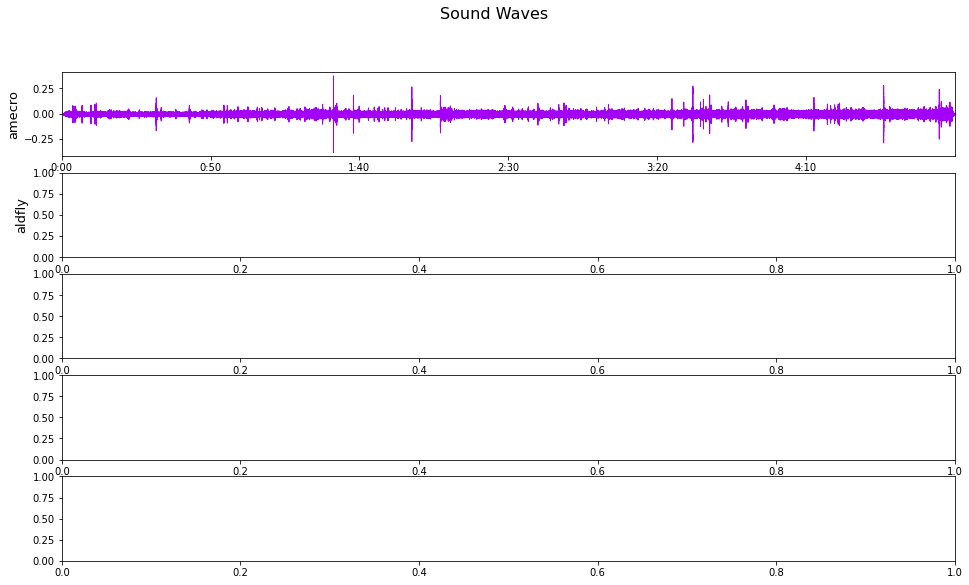

In [56]:
## 1. Sound Waves (2D Representation)¶

fig, ax = plt.subplots(5, figsize = (16, 9))
fig.suptitle('Sound Waves', fontsize=16)

librosa.display.waveplot(y = audio_amecro, sr = sr_amecro, color = "#A300F9", ax=ax[0])
#librosa.display.waveplot(y = audio_cangoo, sr = sr_cangoo, color = "#4300FF", ax=ax[1])
#librosa.display.waveplot(y = audio_haiwoo, sr = sr_haiwoo, color = "#009DFF", ax=ax[2])
#librosa.display.waveplot(y = audio_pingro, sr = sr_pingro, color = "#00FFB0", ax=ax[3])
#librosa.display.waveplot(y = audio_vesspa, sr = sr_vesspa, color = "#D9FF00", ax=ax[4]);

for i, name in zip(range(5), bird_sample_list):
    ax[i].set_ylabel(name, fontsize=13)

### #2. Fourier Transform 🥁

> 📌**Note**: Function that gets a signal in the time domain as input, and outputs its decomposition into frequencies. Transform both the y-axis (frequency) to log scale, and the “color” axis (amplitude) to Decibels, which is approx. the log scale of amplitudes.

In [60]:
## Fourier Transform
##
## NOTE: Function that gets a signal in the time domain as input, 
## and outputs its decomposition into frequencies. 
## Transform both the y-axis (frequency) to log scale, 
## and the “color” axis (amplitude) to Decibels, which is approx 
## the log scale of amplitudes.

# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D_amecro = np.abs(librosa.stft(audio_amecro, n_fft = n_fft, hop_length = hop_length))
#D_cangoo = np.abs(librosa.stft(audio_cangoo, n_fft = n_fft, hop_length = hop_length))
#D_haiwoo = np.abs(librosa.stft(audio_haiwoo, n_fft = n_fft, hop_length = hop_length))
#D_pingro = np.abs(librosa.stft(audio_pingro, n_fft = n_fft, hop_length = hop_length))
#D_vesspa = np.abs(librosa.stft(audio_vesspa, n_fft = n_fft, hop_length = hop_length))

In [61]:
print('Shape of D object:', np.shape(D_amecro))

Shape of D object: (1025, 12920)


### #3. Spectrogram 🎷

> 📌**Note**: 
* What is a spectrogram? A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams (wiki).
* Here we convert the frequency axis to a logarithmic one.

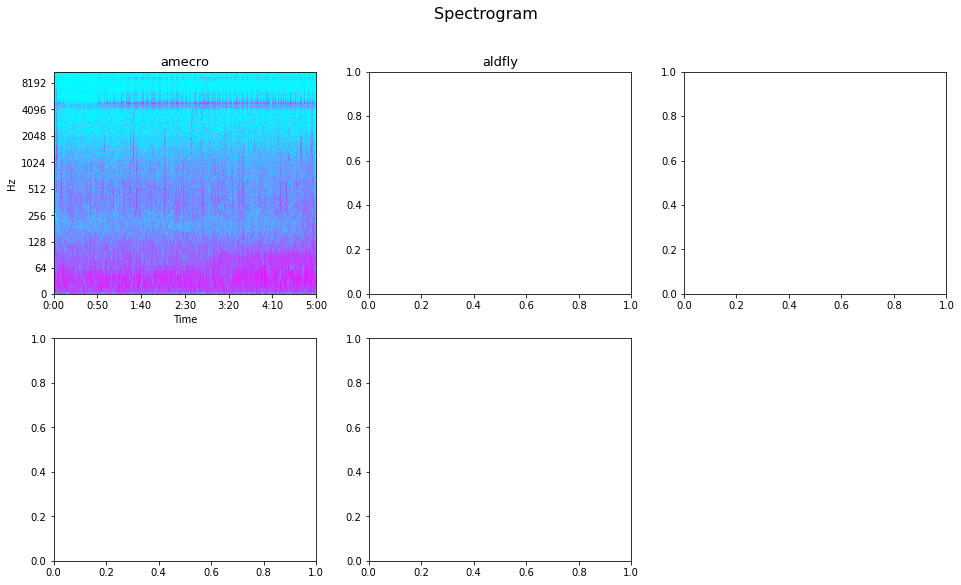

In [65]:
# Convert an amplitude spectrogram to Decibels-scaled spectrogram.
DB_amecro = librosa.amplitude_to_db(D_amecro, ref = np.max)
#DB_cangoo = librosa.amplitude_to_db(D_cangoo, ref = np.max)
#DB_haiwoo = librosa.amplitude_to_db(D_haiwoo, ref = np.max)
#DB_pingro = librosa.amplitude_to_db(D_pingro, ref = np.max)
#DB_vesspa = librosa.amplitude_to_db(D_vesspa, ref = np.max)

# === PLOT ===
fig, ax = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Spectrogram', fontsize=16)
fig.delaxes(ax[1, 2])

librosa.display.specshow(DB_amecro, sr = sr_amecro, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'cool', ax=ax[0, 0])
#librosa.display.specshow(DB_cangoo, sr = sr_cangoo, hop_length = hop_length, x_axis = 'time', 
#                         y_axis = 'log', cmap = 'cool', ax=ax[0, 1])
#librosa.display.specshow(DB_haiwoo, sr = sr_haiwoo, hop_length = hop_length, x_axis = 'time', 
#                         y_axis = 'log', cmap = 'cool', ax=ax[0, 2])
#librosa.display.specshow(DB_pingro, sr = sr_pingro, hop_length = hop_length, x_axis = 'time', 
#                         y_axis = 'log', cmap = 'cool', ax=ax[1, 0])
#librosa.display.specshow(DB_vesspa, sr = sr_vesspa, hop_length = hop_length, x_axis = 'time', 
#                         y_axis = 'log', cmap = 'cool', ax=ax[1, 1]);

for i, name in zip(range(0, 2*3), bird_sample_list):
    x = i // 3
    y = i % 3
    ax[x, y].set_title(name, fontsize=13) 

### #4. Mel Spectrogram 🎷
> 📌**Note**: The Mel Scale, mathematically speaking, is the result of some non-linear transformation of the frequency scale. The Mel Spectrogram is a normal Spectrogram, but with a Mel Scale on the y axis.

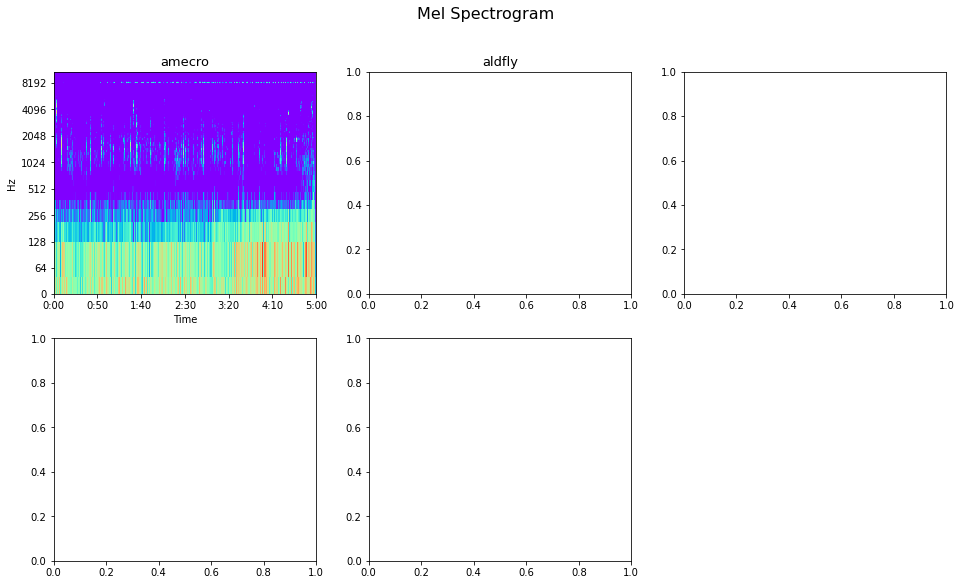

In [67]:
## NOTE: Spectrogram is a normal Spectrogram, but with a Mel Scale on the y axis.
## Mel Scale = the result of some non-linear transformation of the frequency scale

# Create the Mel Spectrograms
S_amecro = librosa.feature.melspectrogram(y_amecro, sr=sr_amecro)
S_DB_amecro = librosa.amplitude_to_db(S_amecro, ref=np.max)
"""
S_cangoo = librosa.feature.melspectrogram(y_cangoo, sr=sr_cangoo)
S_DB_cangoo = librosa.amplitude_to_db(S_cangoo, ref=np.max)

S_haiwoo = librosa.feature.melspectrogram(y_haiwoo, sr=sr_haiwoo)
S_DB_haiwoo = librosa.amplitude_to_db(S_haiwoo, ref=np.max)

S_pingro = librosa.feature.melspectrogram(y_pingro, sr=sr_pingro)
S_DB_pingro = librosa.amplitude_to_db(S_pingro, ref=np.max)

S_vesspa = librosa.feature.melspectrogram(y_vesspa, sr=sr_vesspa)
S_DB_vesspa = librosa.amplitude_to_db(S_vesspa, ref=np.max)
"""

# === PLOT ====
fig, ax = plt.subplots(2, 3, figsize=(16, 9))
fig.suptitle('Mel Spectrogram', fontsize=16)
fig.delaxes(ax[1, 2])

librosa.display.specshow(S_DB_amecro, sr = sr_amecro, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'rainbow', ax=ax[0, 0])
"""
librosa.display.specshow(S_DB_cangoo, sr = sr_cangoo, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'rainbow', ax=ax[0, 1])
librosa.display.specshow(S_DB_haiwoo, sr = sr_haiwoo, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'rainbow', ax=ax[0, 2])
librosa.display.specshow(S_DB_pingro, sr = sr_pingro, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'rainbow', ax=ax[1, 0])
librosa.display.specshow(S_DB_vesspa, sr = sr_vesspa, hop_length = hop_length, x_axis = 'time', 
                         y_axis = 'log', cmap = 'rainbow', ax=ax[1, 1]);
"""
for i, name in zip(range(0, 2*3), bird_sample_list):
    x = i // 3
    y = i % 3
    ax[x, y].set_title(name, fontsize=13)

In [69]:
## Zero Crossing Rate
## Note: the rate at which the signal changes from positive to negative or back.

# Total zero_crossings in our 1 song
zero_amecro = librosa.zero_crossings(audio_amecro, pad=False)
#zero_cangoo = librosa.zero_crossings(audio_cangoo, pad=False)
#zero_haiwoo = librosa.zero_crossings(audio_haiwoo, pad=False)
#zero_pingro = librosa.zero_crossings(audio_pingro, pad=False)
#zero_vesspa = librosa.zero_crossings(audio_vesspa, pad=False)

zero_birds_list = [zero_amecro]#, zero_cangoo, zero_haiwoo, zero_pingro, zero_vesspa]

for bird, name in zip(zero_birds_list, bird_sample_list):
    print("{} change rate is {:,}".format(name, sum(bird)))

amecro change rate is 540,834


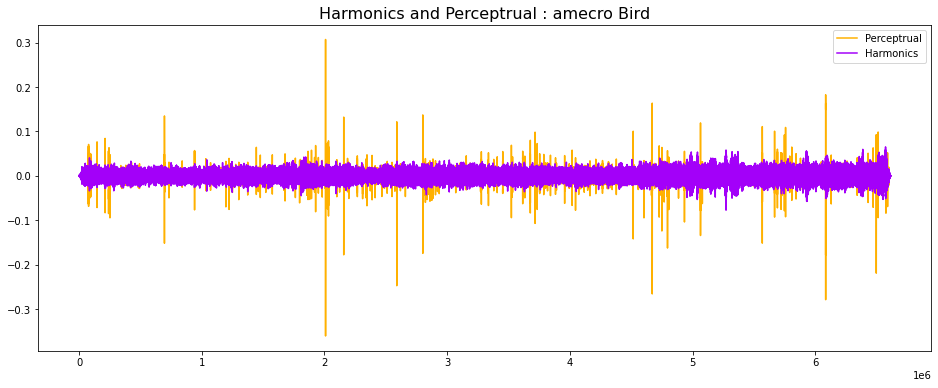

In [70]:
## Harmonics: characteristics that represent the sound color
## & Perceptrual: shock wave represents the sound rhythm and emotion

y_harm_amecro, y_perc_amecro = librosa.effects.hpss(audio_amecro)

plt.figure(figsize = (16, 6))
plt.plot(y_perc_amecro, color = '#FFB100')
plt.plot(y_harm_amecro, color = '#A300F9')
plt.legend(("Perceptrual", "Harmonics"))
plt.title("Harmonics and Perceptrual : amecro Bird", fontsize=16);

In [71]:
## Spectral Centroids
## Indicates where the ”centre of mass” for a sound is located 
## calculated as  weighted mean of the freqs present in the sound.

# Calculate
spectral_centroids = librosa.feature.spectral_centroid(audio_amecro, sr=sr)[0]

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [1699.5003809  1219.34014444 1109.39105951 ... 2431.20617357 1570.07421196
 1187.19920365] 

Shape of Spectral Centroids: (12920,) 

frames: range(0, 12920) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99932154e+02
 2.99955374e+02 2.99978594e+02]


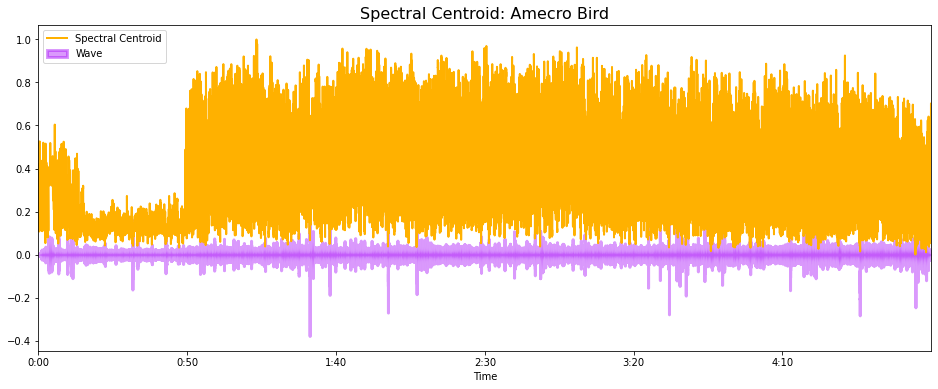

In [72]:
#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (16, 6))
librosa.display.waveplot(audio_amecro, sr=sr, alpha=0.4, color = '#A300F9', lw=3)
plt.plot(t, normalize(spectral_centroids), color='#FFB100', lw=2)
plt.legend(["Spectral Centroid", "Wave"])
plt.title("Spectral Centroid: Amecro Bird", fontsize=16);

### #8. Chroma Frequencies

> 📌**Note**: Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chromas) of the musical octave.

Chromogram Amecro shape: (12, 1324)


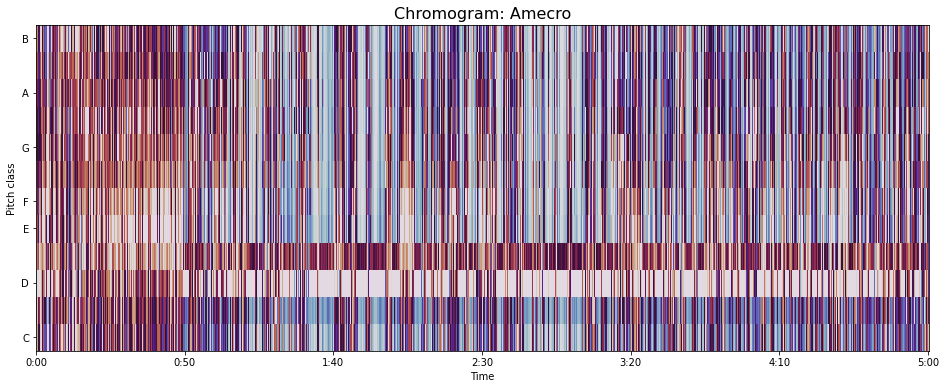

In [73]:
# Increase or decrease hop_length to change how granular you want your data to be
hop_length = 5000

# Chromogram Vesspa
chromagram = librosa.feature.chroma_stft(audio_amecro, sr=sr_amecro, hop_length=hop_length)
print('Chromogram Amecro shape:', chromagram.shape)

plt.figure(figsize=(16, 6))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='twilight')

plt.title("Chromogram: Amecro", fontsize=16);

### #9. Tempo BPM (beats per minute)🎤
> 📌**Note**: Dynamic programming beat tracker.

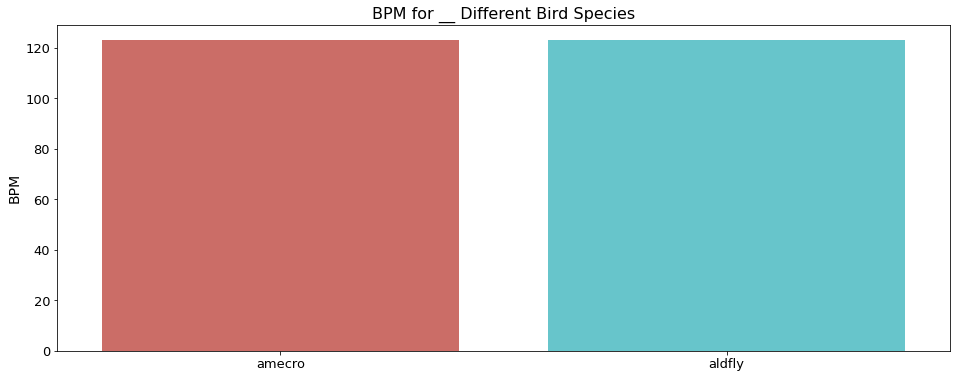

In [79]:
## TEMPO BPM
## Dynamic programming beat tracker!

# Create variable
tempo_amecro, _ = librosa.beat.beat_track(y_amecro, sr = sr_amecro)
#tempo_cangoo, _ = librosa.beat.beat_track(y_cangoo, sr = sr_cangoo)
#tempo_haiwoo, _ = librosa.beat.beat_track(y_haiwoo, sr = sr_haiwoo)
#tempo_pingro, _ = librosa.beat.beat_track(y_pingro, sr = sr_pingro)
#tempo_vesspa, _ = librosa.beat.beat_track(y_vesspa, sr = sr_vesspa)

data = pd.DataFrame({"Type": bird_sample_list , "BPM": tempo_amecro }) #, tempo_cangoo, tempo_haiwoo, tempo_pingro, tempo_vesspa] })

# Image
xy = (0.5, 0.7)

# Plot
plt.figure(figsize = (16, 6))
ax = sns.barplot(y = data["BPM"], x = data["Type"], palette="hls")

plt.ylabel("BPM", fontsize=14)
plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.xlabel("")
plt.title("BPM for __ Different Bird Species", fontsize=16);

### #10. Spectral Rolloff 🥏
> 📌**Note**: Is a measure of the *shape of the signal*. It represents the frequency below which a specified percentage of the total spectral energy (e.g. 85%) lies.

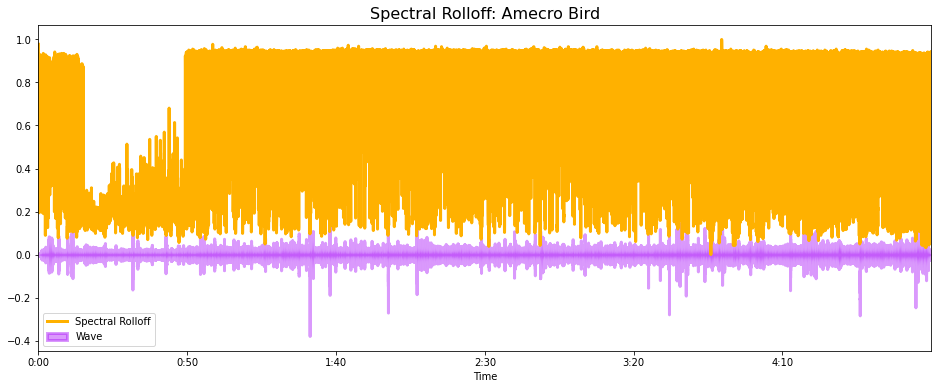

In [80]:
## Spectral RollOff 
## a measure of the shape of the signal, represents freq below which
## a specified percentage of the total spectral energy lies


# Vector
spectral_rolloff = librosa.feature.spectral_rolloff(audio_amecro, sr=sr_amecro)[0]

# Computing the time variable for visualization
frames = range(len(spectral_rolloff))
# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveplot(audio_amecro, sr=sr_amecro, alpha=0.4, color = '#A300F9', lw=3)
plt.plot(t, normalize(spectral_rolloff), color='#FFB100', lw=3)
plt.legend(["Spectral Rolloff", "Wave"])
plt.title("Spectral Rolloff: Amecro Bird", fontsize=16);

[There are many more features that librosa can extract from sound. Check them all here.](https://librosa.org/librosa/0.6.0/feature.html)

# 4. Additional Data ➕➕➕

**[Why stop at 100? thread here](https://www.kaggle.com/c/birdsong-recognition/discussion/159970)**
* [@Vopani](https://www.kaggle.com/rohanrao) kindly scraped the remaining of the available bird audios from Xeno-Canto site.
* The data:
    * doesn't contain already available train audios from competition data
    * only MP3 format
    * same license as the original data
    * no corrupt audio present
    
**However, the Competition Hosts replied with:**
* limiting to 100 audio files had the reason to not overload the memory
* only 100 top rated audios were used
* excluded videos that did not alow derivatives

**They also recommend the following:**
* the upper limit is usually 500 recordings per species
* how many recordings are needed to train? (maybe even less than 100?)

> 📌**Note**: So, should you use the extended data? Should you stick only with original data? *I have no clue, try multiple ideas and see what performs better*

In [ ]:
# Import the .csv files (corresponding with the extended data)
train_extended_A_Z = pd.read_csv("../input/xeno-canto-bird-recordings-extended-a-m/train_extended.csv")

# Create base directory
base_dir_A_M = "../input/xeno-canto-bird-recordings-extended-a-m"
base_dir_N_Z = "../input/xeno-canto-bird-recordings-extended-n-z"

# Create Full Path column to the audio files
train_extended_A_Z['full_path'] = base_dir_A_M + train_extended_A_Z['ebird_code'] + '/' + train_extended_A_Z['filename']

### Sanity Check: are all the files the same length?

In [ ]:
def count_files_dir(dir_name = "Default", pref = "Def"):
    
    birds_names = list(os.listdir(dir_name + "/" + pref))
    total_len = 0

    for bird in birds_names:
        total_len += len(os.listdir(dir_name +"/" + pref + "/" + bird))
        
    return total_len

In [ ]:
A_M = count_files_dir(base_dir_A_M, pref = "A-M")
N_Z = count_files_dir(base_dir_N_Z, pref = "N-Z")

print("There are {:,} birds in A-Z .csv file".format(len(train_extended_A_Z)), "\n" +
      "\n" +
      "and there are {:,} audio recs.".format(A_M + N_Z))

# Work in Progress ... ⏳

# Just a Kind Reminder to always be Mindful and Better 😊

I would like to take this opportunity to end with a personal note. I joined this competition by having in mind nature and the well being of birds (and all life) on this beautiful planet.

This competition suprizes 264 total unique beautiful bird species, but our **kind Earth has more than 10,000 unique colorful birds** that are singing out there at the moment.

But we are [losing species every year due to Global Warming, Polution, and whatever else you would like to name](https://en.wikipedia.org/wiki/List_of_recently_extinct_bird_species).

So, although our input to this community is quite small and there is not much we can do, we can still be mindful with the effect we have every day to this process and try as much as possible to diminuish it. Some ideas are very simple, like:
* buying clothes when needed, not only for fashion sake
* using reusable water bottles
* drinking the morning coffee home and not on-the-go every day
* keeping the outdoors clean by keeping the garbage in a bag until you find a trash
* walking, biking, using public transport more than the car
* etc.

Let's be **mindful and better**!
Thank you for reading this rant. 